In [1]:
!pip install scikit-image

In [2]:
import numpy as np
import pandas as pd
import cv2

from sklearn.datasets import fetch_openml #veri kümesi için kullanılır
from skimage.filters import threshold_otsu #optimal bir eşik değeri belirtir
#görüntü üzerindeki piksel değerlerini 2 sınıfa böler, eşik değerinin üstü bir sınıfa atanır, eşik değerinin altı bir sınıfa atanır

from sklearn.model_selection import train_test_split #veri kümemizi eğitim ve test olarak böler 

from sklearn.tree import DecisionTreeClassifier #karar ağacı sınıflandırma modeli
from sklearn.ensemble import RandomForestClassifier #rastgele orman sınıflandırma modeli

from sklearn.metrics import accuracy_score #başarım ölçütü
from sklearn.metrics import f1_score #başarım ölçütü

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay #confusion matrix hesaplama ve gösterim

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
#MNIST veri kümesi yüklenmesi

mnist=fetch_openml('mnist_784', version=1)

C:\Users\NIDA\miniconda3\lib\site-packages\sklearn\datasets\_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


In [4]:
X=mnist["data"]
y=mnist["target"]

In [5]:
X.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
28*28

784

In [7]:
len(X)

70000

In [8]:
X[X["pixel775"]!=0]

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
282,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,223.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
640,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,95.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1416,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,28.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1608,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3246,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,19.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65988,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,38.0,231.0,156.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65992,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,27.0,253.0,110.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
65999,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,61.0,253.0,130.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
66000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,253.0,74.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
y

0        5
1        0
2        4
3        1
4        9
        ..
69995    2
69996    3
69997    4
69998    5
69999    6
Name: class, Length: 70000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [10]:
y.unique().tolist()

['5', '0', '4', '1', '9', '2', '3', '6', '7', '8']

In [11]:
pd.DataFrame(y).groupby("class").size()

class
0    6903
1    7877
2    6990
3    7141
4    6824
5    6313
6    6876
7    7293
8    6825
9    6958
dtype: int64

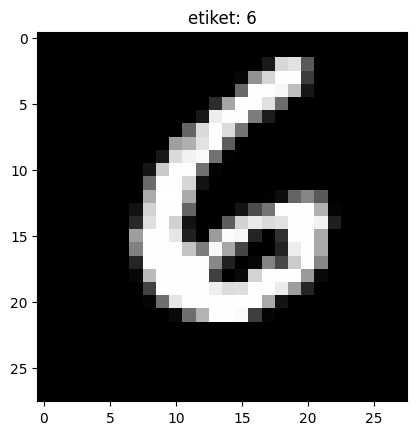

In [12]:
X=mnist["data"].to_numpy()
y=mnist["target"]

#örnek bir görüntü seçme

image_index=90
image=X[image_index].reshape(28,28)

#görüntüyü gösterme

plt.imshow(image, cmap="gray")
plt.title('etiket: '+str(y[image_index]))
plt.show()

In [13]:
image.shape

(28, 28)

In [14]:
X_clean=[]

for image in X:
    threshold_value=threshold_otsu(image)
    binary_image= image>threshold_value
    X_clean.append(binary_image.flatten())

In [15]:
X_clean[5]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [16]:
#Veriyi train ve test olarak bölme

X_train,X_test,y_train,y_test=train_test_split(X_clean,y,test_size=0.2,random_state=42)

In [17]:
X_train

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

In [18]:
len(X_train)

56000

In [19]:
y_train

47339    5
67456    4
12308    8
32557    0
664      2
        ..
37194    6
6265     6
54886    1
860      0
15795    0
Name: class, Length: 56000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [20]:
len(y_train)

56000

In [21]:
(70000*80)/100

56000.0

In [22]:
len(X_test)

14000

In [23]:
X_test

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
      

In [24]:
y_test

46730    8
48393    4
41416    8
34506    7
43725    7
        ..
21525    3
16276    5
24390    2
28061    7
63452    1
Name: class, Length: 14000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [25]:
len(y_test)

14000

In [26]:
#Makine öğrenmesi

model= DecisionTreeClassifier()

#model eğitimi

model.fit(X_train,y_train)

#test veri kümesi üzerinden tahmin yapılması

y_pred=model.predict(X_test)

In [27]:
y_pred

array(['8', '4', '2', ..., '2', '7', '1'], dtype=object)

In [28]:
y_test

46730    8
48393    4
41416    8
34506    7
43725    7
        ..
21525    3
16276    5
24390    2
28061    7
63452    1
Name: class, Length: 14000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [29]:
accuracy= accuracy_score(y_test,y_pred)
print("accuracy: ",accuracy)

accuracy:  0.8671428571428571


In [30]:
f1_score= f1_score(y_test,y_pred, average="weighted")
print("f1_score: ",f1_score)

f1_score:  0.866917806748107


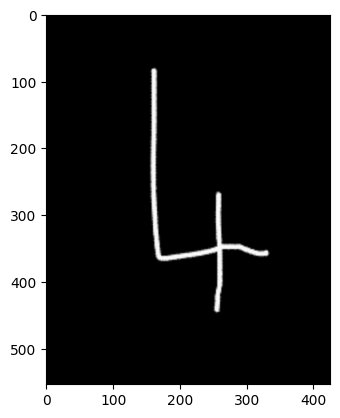

In [44]:
#Dışarıdan örnek veri ile test edilme

image=cv2.imread('data/dort.png')
image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(image)

In [45]:
image.shape

(554, 426, 3)

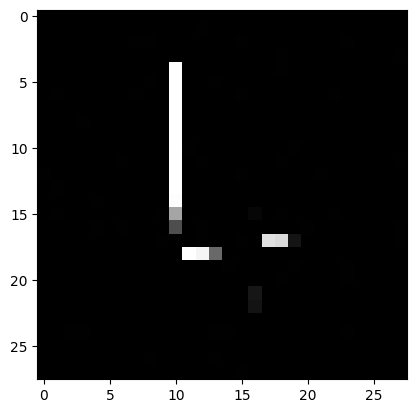

In [53]:
image=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
plt.figure()
plt.imshow(image,cmap='gray')

In [54]:
image.shape

(28, 28)

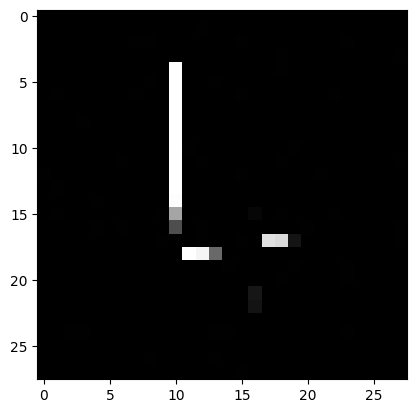

In [55]:
image=cv2.resize(image,(28,28))
plt.imshow(image,cmap='gray')

In [56]:
image.shape

(28, 28)

In [57]:
image_array=np.array(image)

threshold_value=threshold_otsu(image_array)
binary_image= image>threshold_value
image_array= binary_image.flatten()

image_array=image_array.reshape(1,-1) #1 boyutlu vektöre çevirme

In [58]:
image_array

array([[False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False,  True, False, False, False,
      

In [59]:
prediction=model.predict(image_array)
print("tahmin: ",prediction )

tahmin:  ['4']


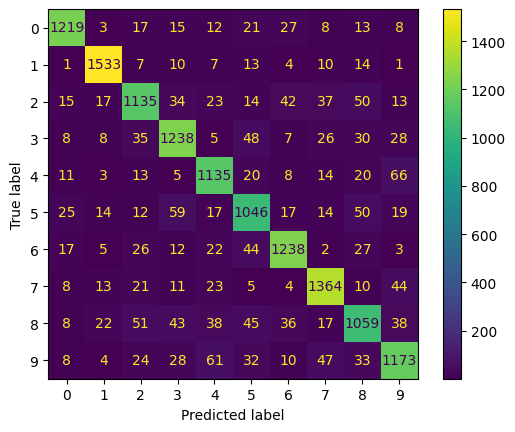

In [60]:
cm=confusion_matrix(y_test,y_pred,labels=model.classes_)
disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model.classes_)
disp.plot()

In [65]:
X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [66]:
from sklearn import metrics

In [68]:
#Veriyi train ve test olarak bölme
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#Makine öğrenmesi
model= DecisionTreeClassifier()

#model eğitimi
model.fit(X_train,y_train)

#test veri kümesi üzerinden tahmin yapılması
y_pred=model.predict(X_test)

accuracy= accuracy_score(y_test,y_pred)
print("accuracy: ",accuracy)

f1_score= metrics.f1_score(y_test,y_pred, average="weighted")
print("f1_score: ",f1_score)

accuracy:  0.8712142857142857
f1_score:  0.8710871404783739


In [69]:
#random forest model

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#Makine öğrenmesi
model= RandomForestClassifier()

#model eğitimi
model.fit(X_train,y_train)

#test veri kümesi üzerinden tahmin yapılması
y_pred=model.predict(X_test)

accuracy= accuracy_score(y_test,y_pred)
print("accuracy: ",accuracy)

f1_score= metrics.f1_score(y_test,y_pred, average="weighted")
print("f1_score: ",f1_score)

accuracy:  0.9667142857142857
f1_score:  0.9666996182821952
